In [2]:
# To look at April 2018

import numpy as np
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from matplotlib import colors  # For consistency with Harris et. al 2022
import netCDF4 as nc
from datetime import datetime, timedelta
# from os.path import exists
# import xarray as xr
# from properscoring import crps_ensemble
# from scipy.interpolate import interp2d
# from scipy.interpolate import LinearNDInterpolator
# from scipy.spatial import Delaunay
from properscoring import crps_ensemble

In [4]:
save_plots = False
plot_dir = "plots"

# To be consistent with the Harris et. al paper.
value_range_precip = (0.1, 15)

# Load IMERG latitudes and longitudes
file_name = f"/home/c/cooperf/Harris/IMERG-regICPAC-6hr/20180423_00.nc4"  # Date doesn't matter
nc_file = nc.Dataset(file_name)
latitude = np.array(nc_file["lat"][:])
longitude = np.array(nc_file["lon"][:])
nc_file.close()

/home/c/cooperf/anaconda3/envs/AOPP/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


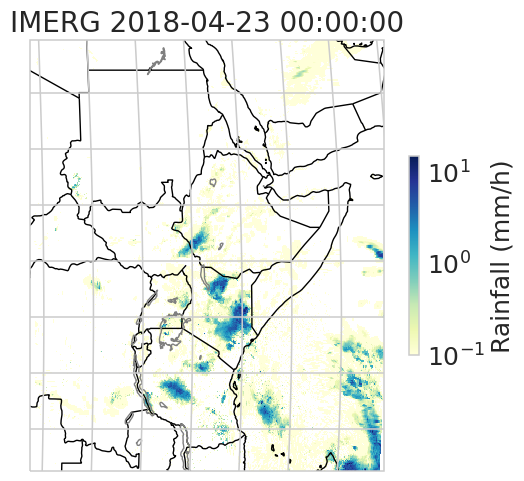

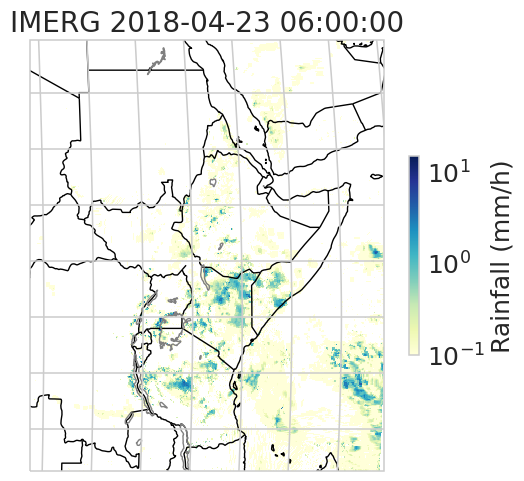

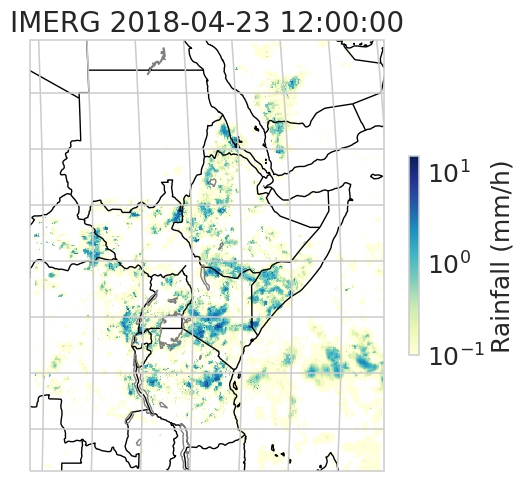

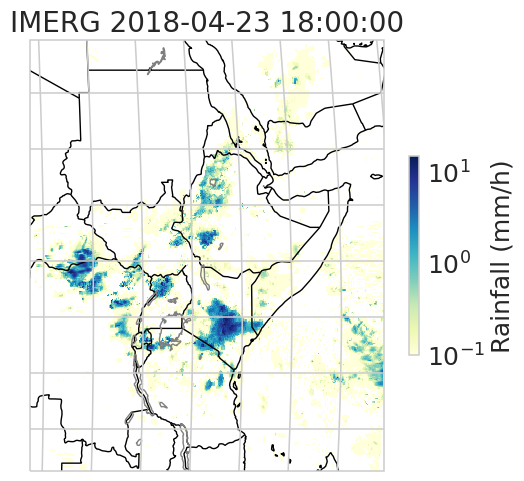

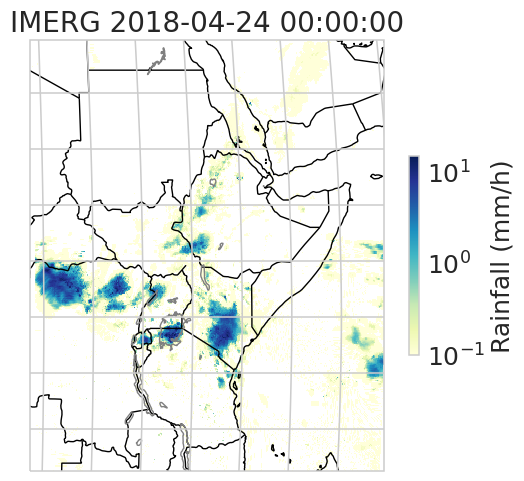

...

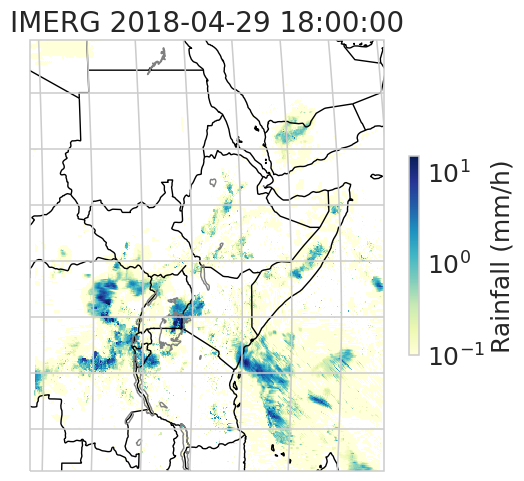

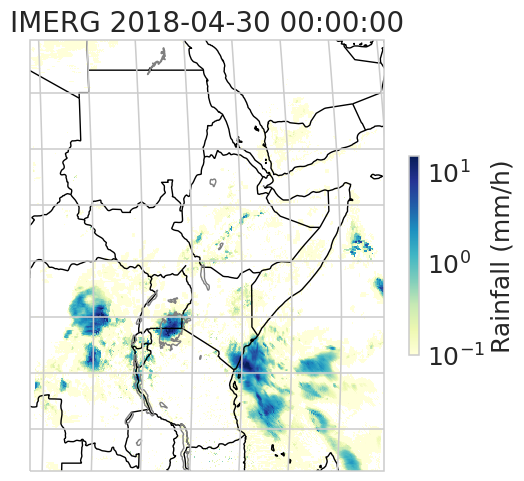

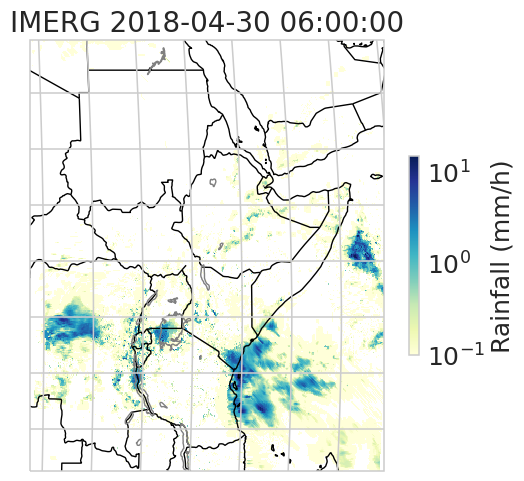

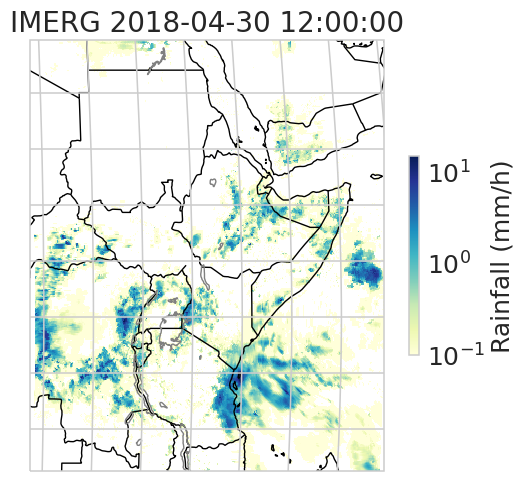

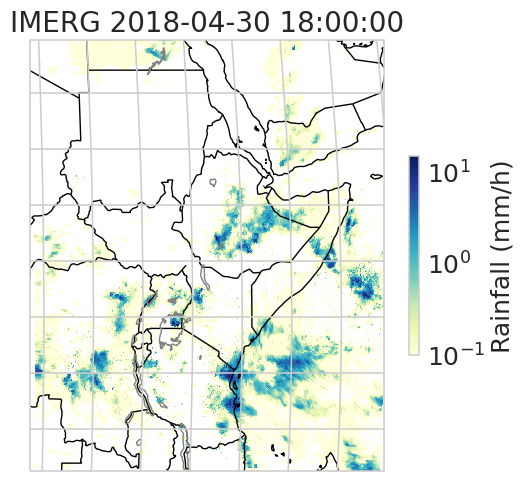

In [5]:
# Find what days this week are interesting
# Looks like midnight the 24th is a large rain storm over Kenya

if True:
    d = datetime(2018,4,23)
    while (d < datetime(2018,5,1)):
    
        file_name = f"/home/c/cooperf/Harris/IMERG-regICPAC-6hr/{d.year}{d.month:02}{d.day:02}_{d.hour:02}.nc4"
        nc_file = nc.Dataset(file_name)
        IMERG_rain = np.array(nc_file["precipitationCal"][:])
        nc_file.close()
    
        #fig = plt.figure(figsize=(16,8))
        fig = plt.figure()
        ax = plt.axes(projection=ccrs.Robinson())
        
        ax.gridlines()
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        #ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.BORDERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
        
        c = plt.pcolormesh(longitude, latitude, IMERG_rain,
                           norm=colors.LogNorm(*value_range_precip),
                           #vmin=-0.1, vmax=0.1,
                           transform=ccrs.PlateCarree(), cmap='YlGnBu')
        
        plt.title(f"IMERG {d}", fontdict = {'fontsize':20})
        cb = plt.colorbar(c, fraction=0.02)
        cb.ax.tick_params(labelsize=18)
        cb.set_label('Rainfall (mm/h)',size=18)
        
        # if save_plots:
        #     plt.savefig("plots/RMSE_change_2020.png", format="png", bbox_inches='tight')
        
        plt.show()
        
        d += timedelta(hours=6)

In [6]:
# Look at the 24th
d = datetime(2018,4,24,0)
file_name = f"/home/c/cooperf/Harris/IMERG-regICPAC-6hr/{d.year}{d.month:02}{d.day:02}_{d.hour:02}.nc4"
nc_file = nc.Dataset(file_name)
IMERG_rain = np.array(nc_file["precipitationCal"][:])
nc_file.close()

In [7]:
# Now look at the IFS ensemble forecast
file_name = f"/home/c/cooperf/IFS/IFS-regICPAC-ens-tp/2018/tp_4.nc"
nc_file = nc.Dataset(file_name)
latitude_IFS = np.array(nc_file["latitude"][1:])
longitude_IFS = np.array(nc_file["longitude"][:])
time = np.array(nc_file["time"][2])
valid_time = np.array(nc_file["valid_time"][2,4])
tp_IFS_inc = np.array(nc_file["tp"][2,:,4:6,1:,:]) * 1000/6  # Convert to mm/h
nc_file.close()

# Convert cumulative rainfall to the rainfall rate
tp_IFS = tp_IFS_inc[:,1,:,:] - tp_IFS_inc[:,0,:,:]
# Remove negative rainfall
tp_IFS[tp_IFS<0.0] = 0.0

# Check that we have the correct coordinates
print(np.max(np.abs(latitude - latitude_IFS)))
print(np.max(np.abs(longitude - longitude_IFS)))
print(datetime(1900,1,1) + timedelta(hours=int(time)))  # Should be one day earlier
print(datetime(1900,1,1) + timedelta(hours=int(valid_time)))

0.0
0.0
2018-04-23 00:00:00
2018-04-24 00:00:00


In [8]:
# What did cGAN do?
file_name = f"/home/c/cooperf/data/cGAN/ICPAC/24h_mk1/GAN_forecasts_2018/GAN_112.nc"
nc_file = nc.Dataset(file_name)
latitude_GAN = np.array(nc_file["latitude"][1:])
longitude_GAN = np.array(nc_file["longitude"][:])
time_GAN = np.array(nc_file["time"])
valid_time_GAN = np.array(nc_file["fcst_valid_time"][0,0])
tp_GAN = np.array(nc_file["precipitation"][0,:,0,:,:])
nc_file.close()

# Check that we have the correct coordinates
print(np.max(np.abs(latitude - latitude_IFS)))
print(np.max(np.abs(longitude - longitude_IFS)))
print(datetime(1900,1,1) + timedelta(hours=int(time_GAN)))  # Should be one day earlier
print(datetime(1900,1,1) + timedelta(hours=int(valid_time_GAN)))

0.0
0.0
2018-04-23 00:00:00
2018-04-24 00:00:00


2018-04-24 00:00:00


/tmp/user/26927/ipykernel_1226824/1186932575.py:109: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')


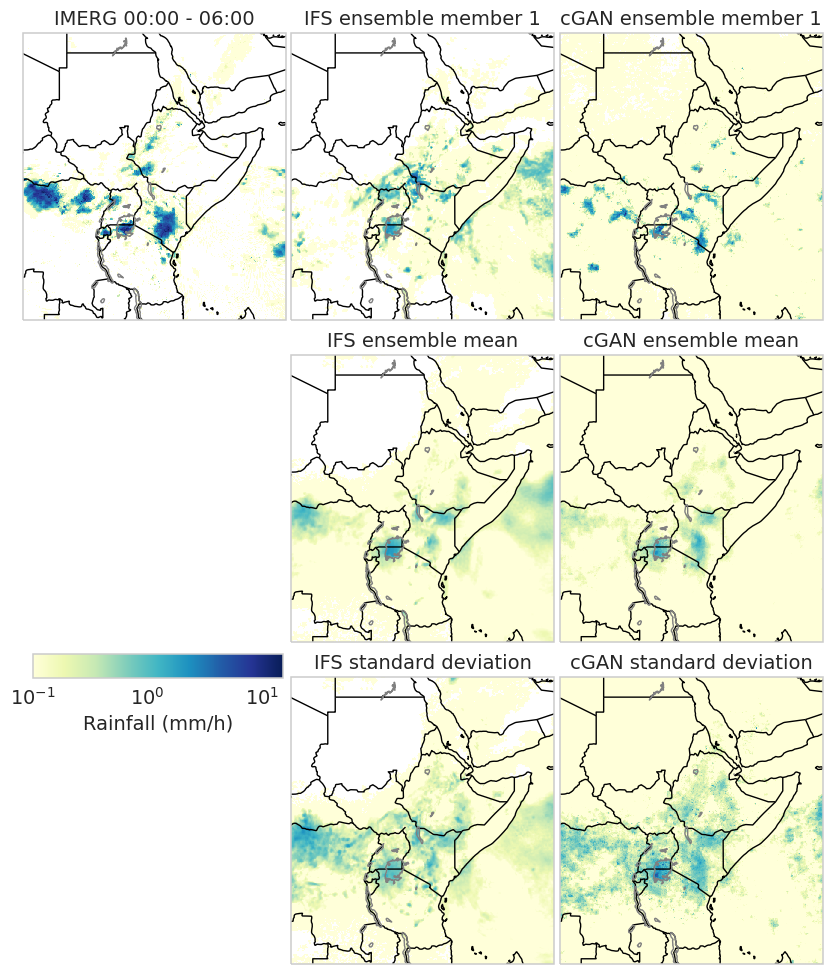

In [9]:
# Compare IMERG, IFS, cGAN

print(d)

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=3, ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(10,12))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()
        
ax=axs[0]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, IMERG_rain, 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IMERG 00:00 - 06:00",size=14)

ax=axs[1]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, tp_IFS[0,:,:], 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS ensemble member 1",size=14)

ax=axs[2]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, tp_GAN[0,:,:], 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"cGAN ensemble member 1",size=14)

axs[3].axis('off')

ax=axs[4]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, np.mean(tp_IFS, axis=0), 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS ensemble mean",size=14)

ax=axs[5]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, np.mean(tp_GAN, axis=0), 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"cGAN ensemble mean",size=14)

axs[6].axis('off')

ax=axs[7]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, np.std(tp_IFS, axis=0, ddof=1), 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS standard deviation",size=14)

ax=axs[8]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, np.std(tp_GAN, axis=0, ddof=1), 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"cGAN standard deviation",size=14)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.11, 0.35, 0.25, 0.02])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')
cb.ax.tick_params(labelsize=14)
cb.set_label('Rainfall (mm/h)',size=14)

# Save the picture
if save_plots:
    plt.savefig(f"{plot_dir}/Rainfall_eg_24-4-2018.png", format="png", bbox_inches='tight')

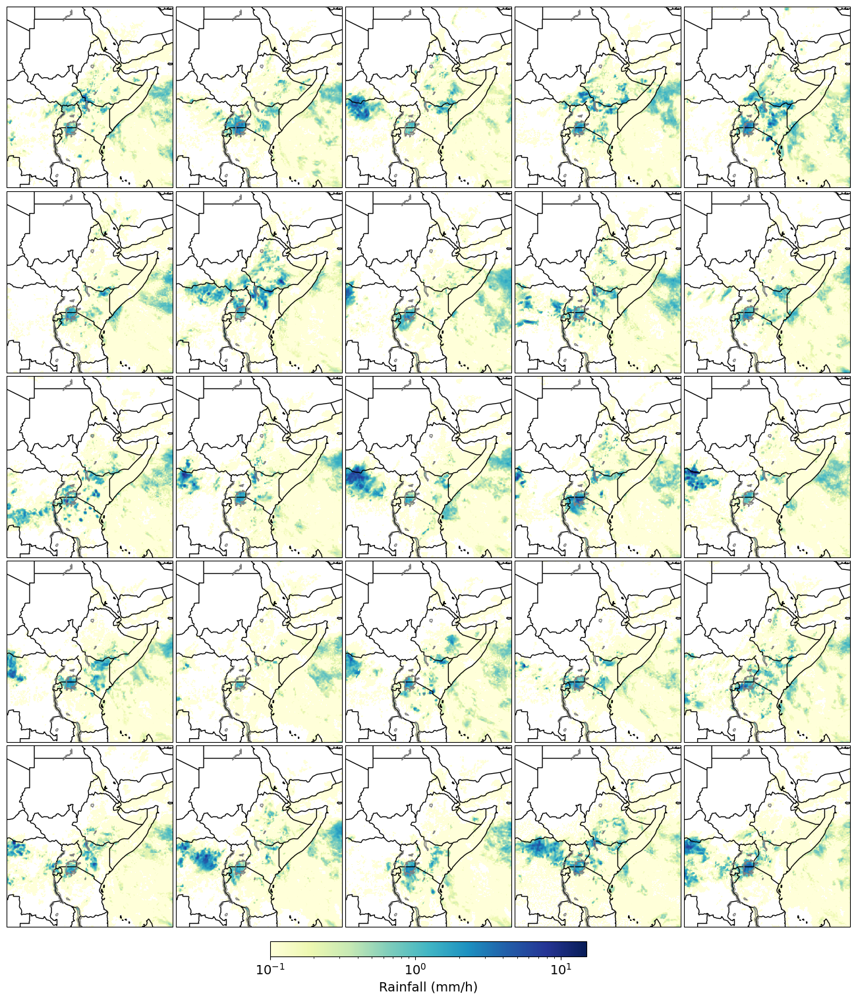

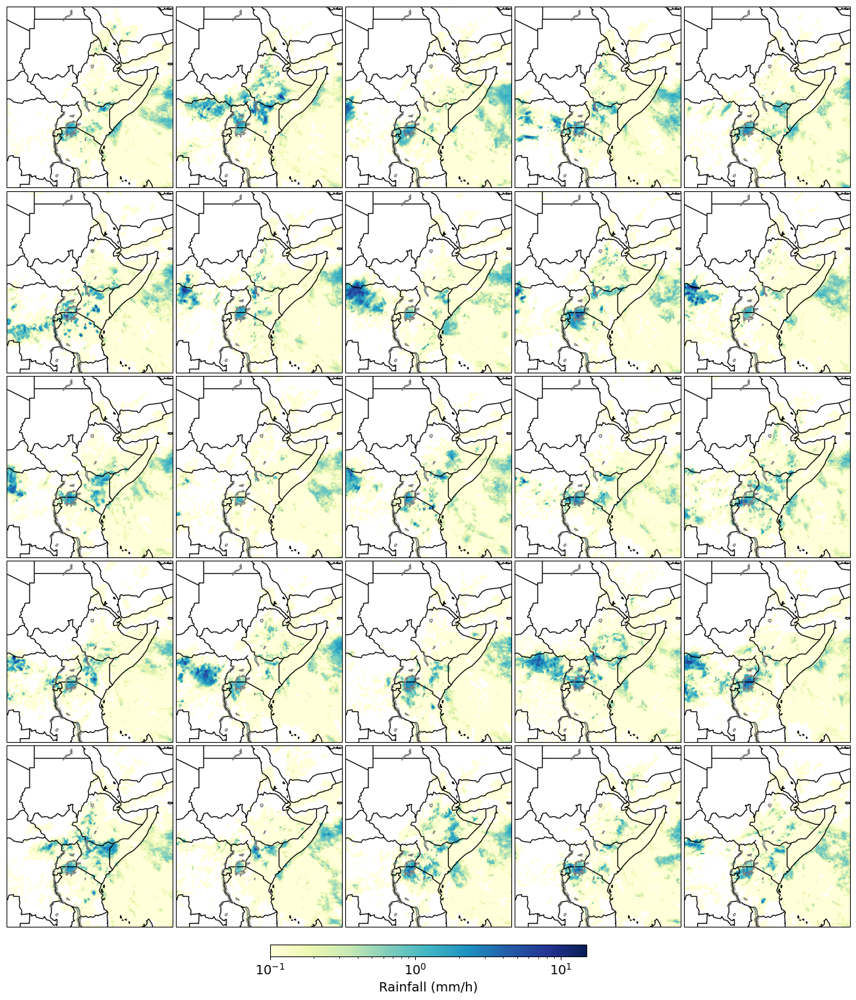

In [55]:
# Plot of all forecasts

ncols = 5
nrows = 5

####################
# first 25 members #
####################

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,18))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

for j in range(nrows):
    for i in range(ncols):
        
        ax=axs[i+j*ncols]
        ax.set_facecolor('white')  # For consistency with Harris et. al 2022
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.BORDERS, linewidth=1)
        #ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
        c = ax.pcolormesh(longitude, latitude, tp_IFS[i+j*ncols,:,:], 
                          norm=colors.LogNorm(*value_range_precip),
                          # vmin=0, vmax=10,
                          transform=ccrs.PlateCarree(), cmap='YlGnBu')
        #ax.set_title(f"IMERG original",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.125, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.35, 0.1, 0.3, 0.0125])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')
cb.ax.tick_params(labelsize=14)
cb.set_label('Rainfall (mm/h)',size=14)

# Save the picture
if save_plots:
   plt.savefig(f"{plot_dir}/IFS_ensemble_24-4-2018_pt1.png", format="png", bbox_inches='tight')

####################
# Final 25 members #
####################

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,18))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

for j in range(nrows):
    for i in range(ncols):
        
        ax=axs[i+j*ncols]
        ax.set_facecolor('white')  # For consistency with Harris et. al 2022
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.BORDERS, linewidth=1)
        #ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
        c = ax.pcolormesh(longitude, latitude, tp_IFS[i+5+j*ncols,:,:], 
                          norm=colors.LogNorm(*value_range_precip),
                          # vmin=0, vmax=10,
                          transform=ccrs.PlateCarree(), cmap='YlGnBu')
        #ax.set_title(f"IMERG original",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.125, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.35, 0.1, 0.3, 0.01])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')
cb.ax.tick_params(labelsize=14)
cb.set_label('Rainfall (mm/h)',size=14)

# Save the picture
if save_plots:
    plt.savefig(f"{plot_dir}/IFS_ensemble_24-4-2018_pt2.png", format="png", bbox_inches='tight')

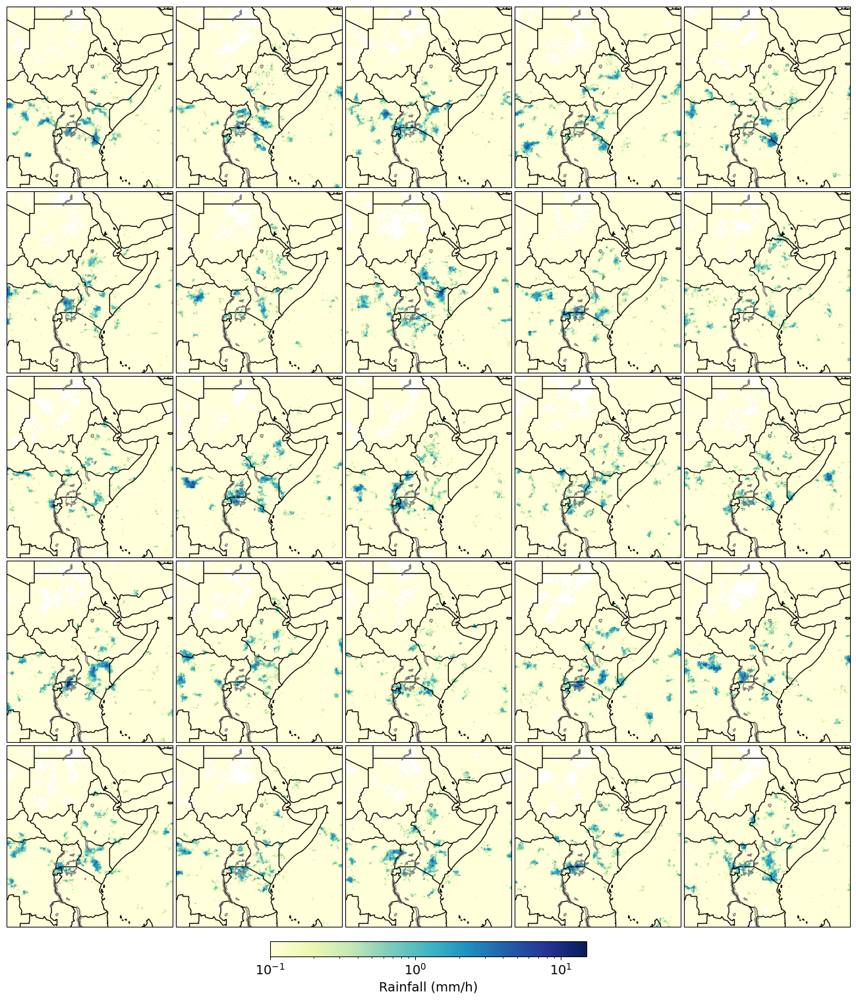

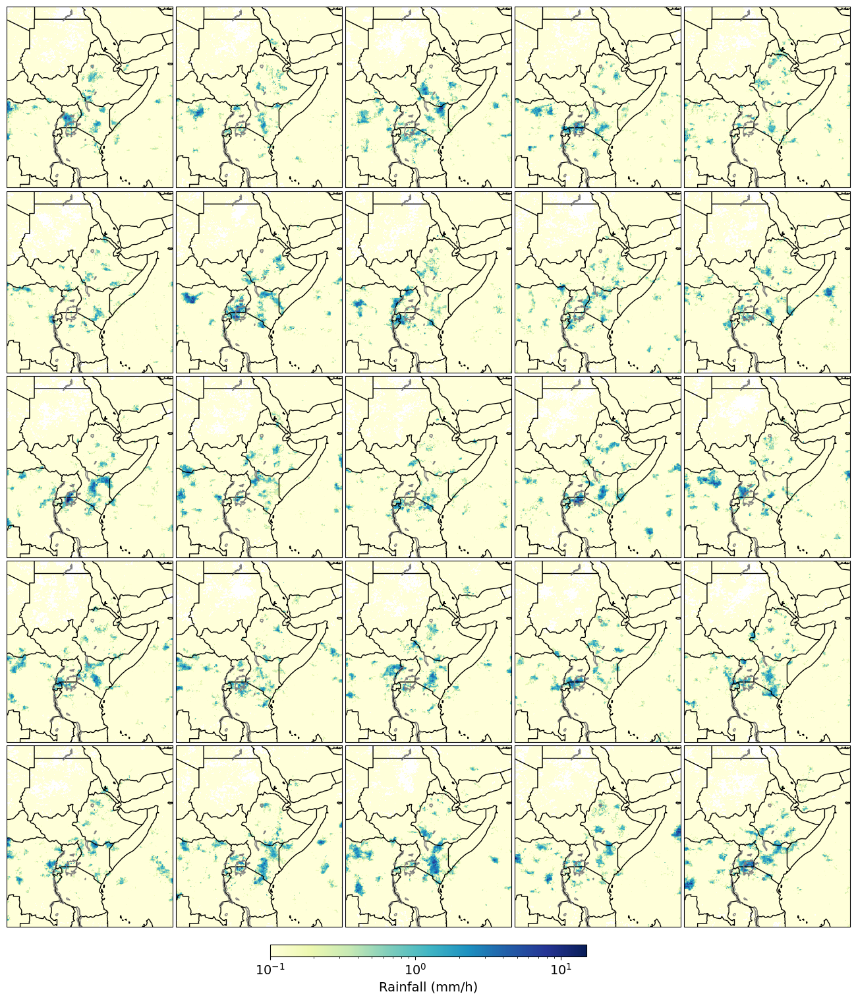

In [56]:
# Plot of all forecasts

ncols = 5
nrows = 5

####################
# first 25 members #
####################

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,18))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

for j in range(nrows):
    for i in range(ncols):
        
        ax=axs[i+j*ncols]
        ax.set_facecolor('white')  # For consistency with Harris et. al 2022
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.BORDERS, linewidth=1)
        #ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
        c = ax.pcolormesh(longitude, latitude, tp_GAN[i+j*ncols,:,:], 
                          norm=colors.LogNorm(*value_range_precip),
                          # vmin=0, vmax=10,
                          transform=ccrs.PlateCarree(), cmap='YlGnBu')
        #ax.set_title(f"IMERG original",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.125, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.35, 0.1, 0.3, 0.0125])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')
cb.ax.tick_params(labelsize=14)
cb.set_label('Rainfall (mm/h)',size=14)

# Save the picture
if save_plots:
   plt.savefig(f"{plot_dir}/cGAN_ensemble_24-4-2018_pt1.png", format="png", bbox_inches='tight')

####################
# Final 25 members #
####################

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,18))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

for j in range(nrows):
    for i in range(ncols):
        
        ax=axs[i+j*ncols]
        ax.set_facecolor('white')  # For consistency with Harris et. al 2022
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.BORDERS, linewidth=1)
        #ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
        ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
        c = ax.pcolormesh(longitude, latitude, tp_GAN[i+5+j*ncols,:,:], 
                          norm=colors.LogNorm(*value_range_precip),
                          # vmin=0, vmax=10,
                          transform=ccrs.PlateCarree(), cmap='YlGnBu')
        #ax.set_title(f"IMERG original",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.125, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.35, 0.1, 0.3, 0.01])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='horizontal')
cb.ax.tick_params(labelsize=14)
cb.set_label('Rainfall (mm/h)',size=14)

# Save the picture
if save_plots:
    plt.savefig(f"{plot_dir}/cGAN_ensemble_24-4-2018_pt2.png", format="png", bbox_inches='tight')

In [57]:
print(f"IMERG whole region mean rainfall: {np.mean(IMERG_rain):.3f} mm/h")
print(f"IFS whole region mean rainfall: {np.mean(tp_IFS):.3f} +/- {np.std(tp_IFS, ddof=1):.3f} mm/h")
print(f"cGAN whole region mean rainfall: {np.mean(tp_GAN):.3f} +/- {np.std(tp_GAN, ddof=1):.3f} mm/h")

IMERG whole region mean rainfall: 0.127 mm/h
IFS whole region mean rainfall: 0.070 +/- 0.269 mm/h
cGAN whole region mean rainfall: 0.047 +/- 0.266 mm/h


In [14]:
# Compute the CRPS
IFS_CRPS = crps_ensemble(IMERG_rain, tp_IFS, axis=0)
cGAN_CRPS = crps_ensemble(IMERG_rain, tp_GAN, axis=0)

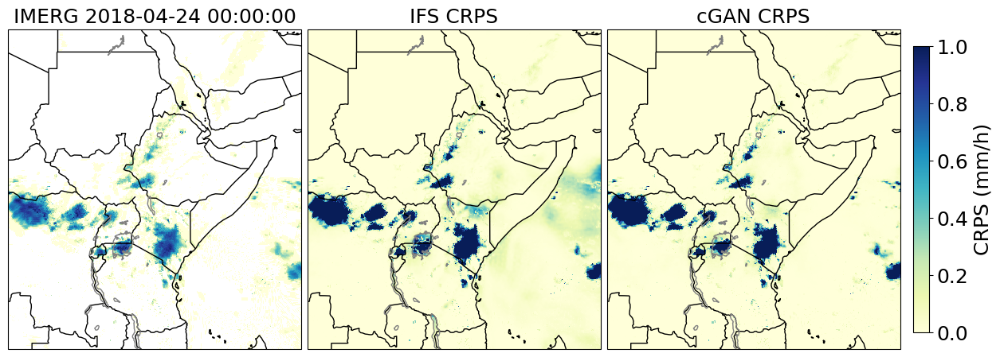

In [15]:
# Compare IMERG, IFS, cGAN using the CRPS

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=1, ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,8))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

ax=axs[0]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, IMERG_rain, 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IMERG {d}",size=18)

ax=axs[1]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, IFS_CRPS, 
                  #norm=colors.LogNorm(*value_range_precip),
                  vmin=0, vmax=1,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS CRPS",size=18)

ax=axs[2]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, cGAN_CRPS, 
                  #norm=colors.LogNorm(*value_range_precip),
                  vmin=0, vmax=1,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"cGAN CRPS",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.81, 0.275, 0.0125, 0.45])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='vertical')
cb.ax.tick_params(labelsize=18)
cb.set_label('CRPS (mm/h)',size=18)

# Save the picture
# plt.savefig(f"{plot_dir}/test.png", format="png", bbox_inches='tight')

In [16]:
# Check agains the IFS ensemble mean used to train cGAN

file_name = f"data/IFS-regICPAC-meansd/2018/tp.nc"
nc_file = nc.Dataset(file_name)
latitude_IFS_msd = np.array(nc_file["latitude"][:])
longitude_IFS_msd = np.array(nc_file["longitude"][:])
time_msd = np.array(nc_file["time"][112])
valid_time_msd = np.array(nc_file["fcst_valid_time"][112,4])
tp_mean_IFS = np.array(nc_file["tp_mean"][112,4,:,:]) * 1000/6  # Convert to mm/h
nc_file.close()

# Check that we have the correct coordinates
print(np.max(np.abs(latitude - latitude_IFS_msd)))
print(np.max(np.abs(longitude - longitude_IFS_msd)))
print(datetime(1900,1,1) + timedelta(hours=int(time_msd)))  # Should be one day earlier
print(datetime(1900,1,1) + timedelta(hours=int(valid_time_msd)))

0.0
0.0
2018-04-23 00:00:00
2018-04-24 00:00:00


In [17]:
# Difference between the pre-computed ensemble mean and the ensemble mean of this date
np.max(np.abs(tp_mean_IFS - np.mean(tp_IFS, axis=0)))

2.543167e-05

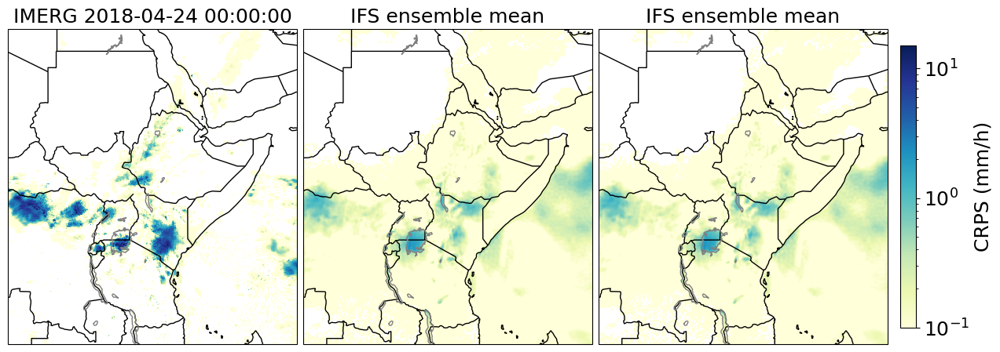

In [18]:
# Check consistency of the IFS ensemble mean

# Define the figure and each axis for the rows and columns
fig, axs = plt.subplots(nrows=1, ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16,8))

# axs is a 2 dimensional array of `GeoAxes`. Flatten it into a 1-D array
axs=axs.flatten()

ax=axs[0]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, IMERG_rain, 
                  norm=colors.LogNorm(*value_range_precip),
                  # vmin=0, vmax=10,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IMERG {d}",size=18)

ax=axs[1]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, np.mean(tp_IFS, axis=0), 
                  norm=colors.LogNorm(*value_range_precip),
                  #vmin=0, vmax=7.5,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS ensemble mean",size=18)

ax=axs[2]
ax.set_facecolor('white')  # For consistency with Harris et. al 2022
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=1)
#ax.add_feature(cfeature.RIVERS, linewidth=1,edgecolor='black')
ax.add_feature(cfeature.LAKES, linewidth=1,linestyle='-',edgecolor='grey',facecolor='none')
c = ax.pcolormesh(longitude, latitude, tp_mean_IFS, 
                  norm=colors.LogNorm(*value_range_precip),
                  #vmin=0, vmax=7.5,
                  transform=ccrs.PlateCarree(), cmap='YlGnBu')
ax.set_title(f"IFS ensemble mean",size=18)

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.81, 0.275, 0.0125, 0.45])

# Draw the colorbar
cb=fig.colorbar(c, cax=cbar_ax,orientation='vertical')
cb.ax.tick_params(labelsize=18)
cb.set_label('CRPS (mm/h)',size=18)

# Save the picture
# plt.savefig(f"{plot_dir}/test.png", format="png", bbox_inches='tight')

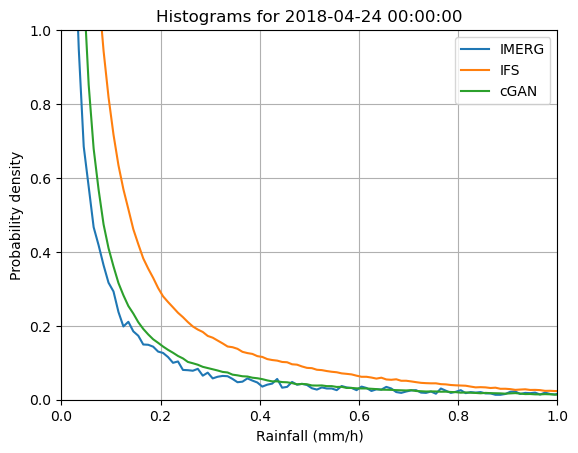

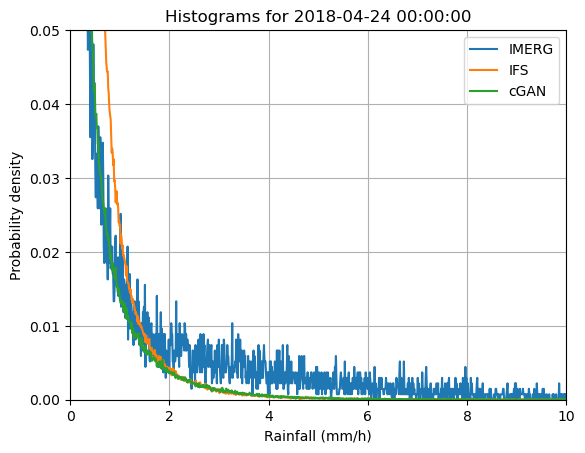

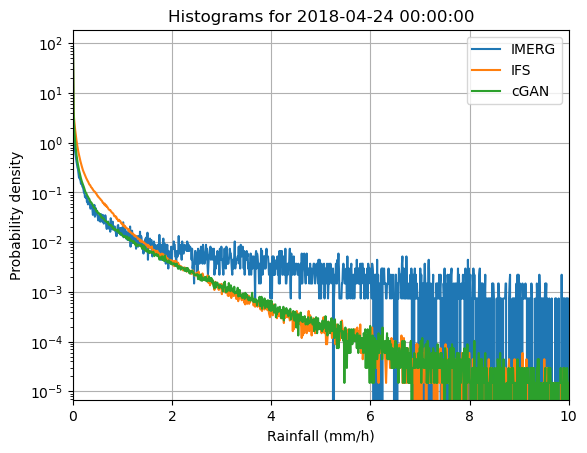

In [19]:
bins = np.linspace(0,100,10000)
x = (bins[:-1] + bins[1:])/2

IMERG_PDF,_ = np.histogram(IMERG_rain.flatten(), bins, density=True)
IFS_PDF,_ = np.histogram(tp_IFS.flatten(), bins, density=True)
cGAN_PDF,_ = np.histogram(tp_GAN.flatten(), bins, density=True)

plt.plot(x,IMERG_PDF,label="IMERG")
plt.plot(x,IFS_PDF,label="IFS")
plt.plot(x,cGAN_PDF,label="cGAN")
plt.xlim(0,1)
plt.ylim(0,1)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("Rainfall (mm/h)")
plt.ylabel("Probability density")
plt.legend()
plt.show()

plt.plot(x,IMERG_PDF,label="IMERG")
plt.plot(x,IFS_PDF,label="IFS")
plt.plot(x,cGAN_PDF,label="cGAN")
plt.xlim(0,10)
plt.ylim(0,0.05)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("Rainfall (mm/h)")
plt.ylabel("Probability density")
plt.legend()
plt.show()

plt.semilogy(x,IMERG_PDF,label="IMERG")
plt.semilogy(x,IFS_PDF,label="IFS")
plt.semilogy(x,cGAN_PDF,label="cGAN")
plt.xlim(0,10)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("Rainfall (mm/h)")
plt.ylabel("Probability density")
plt.legend()
plt.show()

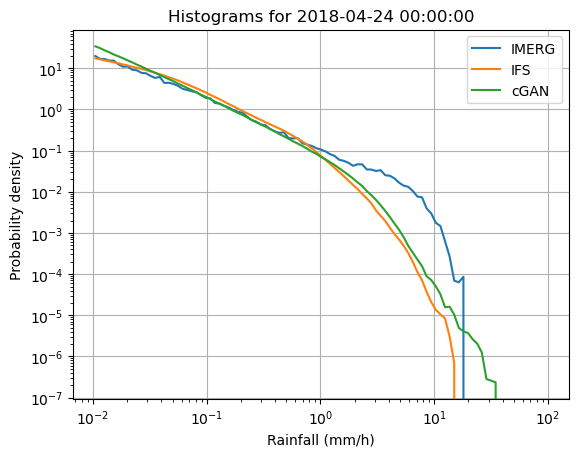

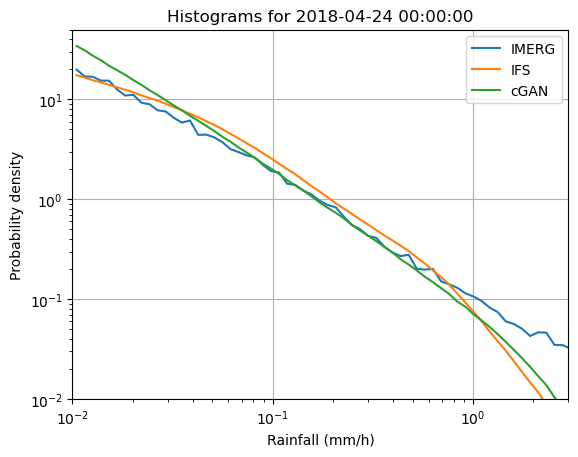

In [20]:
bins = np.exp(np.linspace(np.log(0.01),np.log(101),100))  # Exponential spacing for a log-log plot
x = (bins[:-1] + bins[1:])/2

IMERG_PDF,_ = np.histogram(IMERG_rain.flatten(), bins, density=True)
IFS_PDF,_ = np.histogram(tp_IFS.flatten(), bins, density=True)
cGAN_PDF,_ = np.histogram(tp_GAN.flatten(), bins, density=True)

plt.loglog(x,IMERG_PDF,label="IMERG")
plt.loglog(x,IFS_PDF,label="IFS")
plt.loglog(x,cGAN_PDF,label="cGAN")
#plt.xlim(1e-2,3e0)
#plt.ylim(1e-2,5e1)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("Rainfall (mm/h)")
plt.ylabel("Probability density")
plt.legend()
plt.show()

plt.loglog(x,IMERG_PDF,label="IMERG")
plt.loglog(x,IFS_PDF,label="IFS")
plt.loglog(x,cGAN_PDF,label="cGAN")
plt.xlim(1e-2,3e0)
plt.ylim(1e-2,5e1)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("Rainfall (mm/h)")
plt.ylabel("Probability density")
plt.legend()
plt.show()

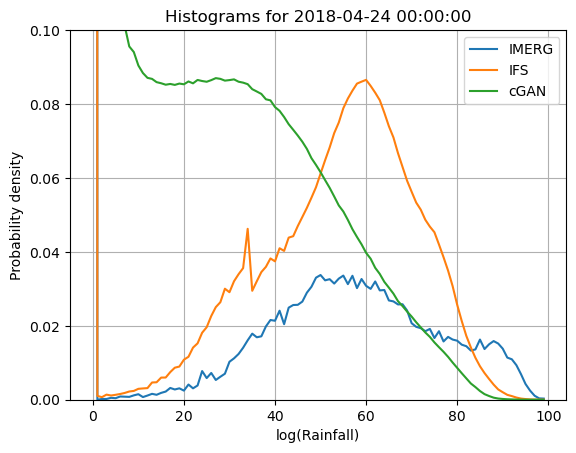

In [21]:
bins = np.linspace(-12.5,3,100)
x = (bins[:-1] + bins[1:])/2

IMERG_log_PDF,_ = np.histogram(np.log(IMERG_rain.flatten()+1e-5), 100, density=True)
IFS_log_PDF,_ = np.histogram(np.log(tp_IFS.flatten()+1e-5), 100, density=True)
cGAN_log_PDF,_ = np.histogram(np.log(tp_GAN.flatten()+1e-5), 100, density=True)

plt.plot(IMERG_log_PDF,label="IMERG")
plt.plot(IFS_log_PDF,label="IFS")
plt.plot(cGAN_log_PDF,label="cGAN")
#plt.xlim(0,1)
plt.ylim(0,0.1)
plt.grid()
plt.title(f"Histograms for {d}")
plt.xlabel("log(Rainfall)")
plt.ylabel("Probability density")
plt.legend()
plt.show()